# EDA-Project 1

Это ваш первый проект из второго блока курса Data Science. 
Вам предоставляется следующий файл: ```"foreign_exchange_rates.csv"```.

Сделайте EDA по данным. 
Перечислите вопросы, которые вы считаете важными. Затем попробуйте ответить на каждый вопрос, с подде, визуализации. Пожалуйста, сделайте ваш код чистым, а аргументы понятными.


***
Для выполнения задания требуется визуальный осмотр данных. После этого будет составлен список предполагаемых вопросов.


**<span style="color: red;">ВНИМАНИЕ</span>**

<div style="background-color: #FAF0C6;">

Для построения парных графиков валютных пар в **п.10.3.3.** машиной было затрачено примерно <span style="color: red;">~290 минут</span>.

</div>

## **1. Исходные данные**

### 1.1. Блок импорта

In [1]:
from pandas import DataFrame, concat, Series
import numpy as np
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
from math import ceil

# данная строка закомментирована специально
# %matplotlib inline

In [2]:
# отображение целиком DataFrame на экране
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)

# ФУНКЦИЯ СОЗДАНИЯ КАТАЛОГОВ
def mkdirs(root:str) -> None:
    # нормализация пути
    os.path.normpath(root)
    # создание каталогов
    if not os.path.isdir(root):
        os.makedirs(root)

# создание каталога для сохранения результатов обработки
mkdirs(root='./data')

### 1.2. Загрузка данных

In [3]:
# загрузка первичных данных из файла
with open(file='./foreign_exchange_rates.csv', mode="r", encoding="UTF-8") as file:
    df_data = pd.read_csv(filepath_or_buffer=file,    # файл
                          delimiter=",",              # разделитель данных
                          index_col=0,                # убираем пустой 1й столбец без названия
                          skipinitialspace=True)      # пропуск пробелов перед и после разделителя


### 1.3. Таблица исходных данных

In [4]:
df_data

,Time Serie,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,KOREA - WON/US$,MEXICO - MEXICAN PESO/US$,SOUTH AFRICA - RAND/US$,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
0,2000-01-03,1.5172,0.9847,1.9033,0.6146,1.805,1.4465,8.2798,7.7765,43.55,1128,9.4015,6.126,1.6563,7.329,101.7,3.8,7.964,8.443,72.3,1.5808,31.38,36.97
1,2000-01-04,1.5239,0.97,1.9238,0.6109,1.8405,1.4518,8.2799,7.7775,43.55,1122.5,9.457,6.085,1.6535,7.218,103.09,3.8,7.934,8.36,72.65,1.5565,30.6,37.13
2,2000-01-05,1.5267,0.9676,1.9339,0.6092,1.856,1.4518,8.2798,7.778,43.55,1135,9.535,6.07,1.656,7.208,103.77,3.8,7.935,8.353,72.95,1.5526,30.8,37.1
3,2000-01-06,1.5291,0.9686,1.9436,0.607,1.84,1.4571,8.2797,7.7785,43.55,1146.5,9.567,6.08,1.6655,7.2125,105.19,3.8,7.94,8.3675,72.95,1.554,31.75,37.62
4,2000-01-07,1.5272,0.9714,1.938,0.6104,1.831,1.4505,8.2794,7.7783,43.55,1138,9.52,6.057,1.6625,7.2285,105.17,3.8,7.966,8.415,73.15,1.5623,30.85,37.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5212,2019-12-25,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND
5213,2019-12-26,1.4411,0.9007,1.5002,0.7688,4.0602,1.3124,6.9949,7.788,71.28,1161.18,18.944,14.132,1.354,6.7295,109.67,4.1337,8.8799,9.4108,181.3,0.9808,30.11,30.15
5214,2019-12-27,1.4331,0.8949,1.4919,0.7639,4.0507,1.3073,6.9954,7.7874,71.45,1160.87,18.819,14.025,1.352,6.6829,109.47,4.126,8.8291,9.3405,181.35,0.9741,30.09,30.14
5215,2019-12-30,1.4278,0.8915,1.4846,0.761,4.0152,1.3058,6.9864,7.7857,71.3,1155.75,18.863,14.056,1.3483,6.6589,108.85,4.1053,8.7839,9.3145,181.6,0.9677,30.04,29.94


# **2. ВОПРОСЫ И ПЛАН ДЕЙСТВИЙ**

## **2.1** <span style="color: blue;">**ЧТО МОЖНО СДЕЛАТЬ С ДАННЫМИ**</span>

```    
1. Получить статистические данные по каждой валюте:

    1.1. max;
    1.2. mean;
    1.3. median;
    1.4. min,
    1.5. std.

2. Построить матрицу корреляции курсов валют:

    2.1. для всех видов;
    2.2. для курсов с высокой корреляцией.

3. Построить графики:

    3.1. График матрицы корреляции.
    3.2. Курсов валют:

        3.2.1. за месяц;
        3.2.2. за квартал;
        3.2.3. за год;
        3.2.4. за весь период.

4. Сделать выводы на основе анализа данных.

```

***
## **2.2.** <span style="color: green;">**ЧТО НУЖНО СДЕЛАТЬ С ДАННЫМИ**</span>

```    
1. Визуально проверить исходный файл 'scv' с данными на:

    1.1. Общую информацию о данных. 
    1.2. наличие аномалий, которые могут повлиять на обработку:
        1.2.1. пустые значения,
        1.2.2. наличие символов в данных,
        1.2.3. другое.


2. Загрузить данные в DataFrame.

3. Проверить данные на аномалии, не замеченные в пункт 1.2.

4. Первичный статистический разбор:

    4.1. Типы данных,
    4.2. Уникальные значения,
    4.3. Пустые значения,
    
5. Приведение типов с добавлением в таблицу:

    5.1. строковые в цифры;
    5.2. даты на составляющие (год, месяц, день, название дня)

6. Основной статистический разбор:
    
    6.1. Определенением агрегаторов,
    6.2. Построение матрицы корреляции.

7. Построение графиков.

8. Выводы на основе анализа данных.

```

# **3. СБОР ДАННЫХ**

### 3.1. Статистическая информация по исходным данным

#### 3.1.1. Просмотр типов данных

Результат показывает, что все столбцы имеют не цифровые значения. Для построения матрицы корреляции и построения графиков потребуется перевести все необходимые типы данных к цифровому формату.

In [5]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5217 entries, 0 to 5216
Data columns (total 23 columns):
 #   Column                                     Non-Null Count  Dtype 
---  ------                                     --------------  ----- 
 0   Time Serie                                 5217 non-null   object
 1   AUSTRALIA - AUSTRALIAN DOLLAR/US$          5217 non-null   object
 2   EURO AREA - EURO/US$                       5217 non-null   object
 3   NEW ZEALAND - NEW ZELAND DOLLAR/US$        5217 non-null   object
 4   UNITED KINGDOM - UNITED KINGDOM POUND/US$  5217 non-null   object
 5   BRAZIL - REAL/US$                          5217 non-null   object
 6   CANADA - CANADIAN DOLLAR/US$               5217 non-null   object
 7   CHINA - YUAN/US$                           5217 non-null   object
 8   HONG KONG - HONG KONG DOLLAR/US$           5217 non-null   object
 9   INDIA - INDIAN RUPEE/US$                   5217 non-null   object
 10  KOREA - WON/US$                     

#### 3.1.2. Уникальные значения

In [6]:
df_data.value_counts

<bound method DataFrame.value_counts of       Time Serie AUSTRALIA - AUSTRALIAN DOLLAR/US$ EURO AREA - EURO/US$ NEW ZEALAND - NEW ZELAND DOLLAR/US$ UNITED KINGDOM - UNITED KINGDOM POUND/US$ BRAZIL - REAL/US$ CANADA - CANADIAN DOLLAR/US$ CHINA - YUAN/US$ HONG KONG - HONG KONG DOLLAR/US$ INDIA - INDIAN RUPEE/US$ KOREA - WON/US$ MEXICO - MEXICAN PESO/US$ SOUTH AFRICA - RAND/US$ SINGAPORE - SINGAPORE DOLLAR/US$ DENMARK - DANISH KRONE/US$ JAPAN - YEN/US$ MALAYSIA - RINGGIT/US$ NORWAY - NORWEGIAN KRONE/US$ SWEDEN - KRONA/US$ SRI LANKA - SRI LANKAN RUPEE/US$ SWITZERLAND - FRANC/US$ TAIWAN - NEW TAIWAN DOLLAR/US$ THAILAND - BAHT/US$
0     2000-01-03                            1.5172               0.9847                              1.9033                                    0.6146             1.805                       1.4465           8.2798                           7.7765                    43.55            1128                    9.4015                   6.126                           1.6

#### 3.1.3. Общая Статистика уникальных значений

In [7]:
df_data.describe()

,Time Serie,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,KOREA - WON/US$,MEXICO - MEXICAN PESO/US$,SOUTH AFRICA - RAND/US$,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
count,5217,5217,5217,5217,5217,5217,5217,5217,5217,5217,5217,5217,5217,5217,5217,5217,5217,5217,5217,5217,5217,5217,5217
unique,5217,2959,2704,2681,2303,3880,3147,2711,893,1998,3423,4249,3759,2927,4462,2848,1788,4511,4574,1781,3190,714,1380
top,2000-01-03,ND,ND,ND,ND,ND,ND,8.2765,ND,ND,ND,ND,ND,ND,ND,ND,3.8,ND,ND,ND,ND,ND,ND
freq,1,198,198,198,198,198,198,208,198,199,198,198,198,198,198,198,1376,198,198,198,198,201,198


#### 3.1.4. Проверка уникальности значений в колонке даты 'Time Serie'
Проверка двумя способами есть ли повторяющиеся значения, более, чем за 1 день.
Оба варианта подтверждают уникальность дат. `Вариант 2` сравнивает количество уникальных значений с общим количеством строк в столбце.

**Вывод**: Даты в столбце `'Time Serie'` не повторяются.

In [8]:
# Вариант 1
df_data['Time Serie'].value_counts().max()


1

In [9]:
# Вариант 2
len(df_data['Time Serie'].unique()) == len(df_data['Time Serie'])

True

3.1.5 Определение пустых значений

In [10]:
# Определение пустых значений
df_data.isnull().sum()

Time Serie                                   0
AUSTRALIA - AUSTRALIAN DOLLAR/US$            0
EURO AREA - EURO/US$                         0
NEW ZEALAND - NEW ZELAND DOLLAR/US$          0
UNITED KINGDOM - UNITED KINGDOM POUND/US$    0
BRAZIL - REAL/US$                            0
CANADA - CANADIAN DOLLAR/US$                 0
CHINA - YUAN/US$                             0
HONG KONG - HONG KONG DOLLAR/US$             0
INDIA - INDIAN RUPEE/US$                     0
KOREA - WON/US$                              0
MEXICO - MEXICAN PESO/US$                    0
SOUTH AFRICA - RAND/US$                      0
SINGAPORE - SINGAPORE DOLLAR/US$             0
DENMARK - DANISH KRONE/US$                   0
JAPAN - YEN/US$                              0
MALAYSIA - RINGGIT/US$                       0
NORWAY - NORWEGIAN KRONE/US$                 0
SWEDEN - KRONA/US$                           0
SRI LANKA - SRI LANKAN RUPEE/US$             0
SWITZERLAND - FRANC/US$                      0
TAIWAN - NEW 

## **4. ОБРАБОТКА ДАННЫХ**

In [11]:
# копия исходных данных
df_DATE = df_data.copy()

### 4.1. Проверка и Выборка всех строк, содержащих значения, которые нельзя перевести в цифровой тип

In [12]:
# список нецифровых значений во всех ячейках DataFrame
# 1. Выборка всех данных кроме 1го столбца 'Time Serie'
# 2. Замена первого вхождения разделителя разрядов и
# 3. Сравнения его на содержание в строке цифрового типа данных
nondigit_values_list = [val for val in np.unique(df_DATE.iloc[:,1:].values.tolist()) if not val.replace('.', '', 1).isdigit()]
nondigit_values_list

['ND']

### 4.2. Изучение строк, не содержащих цифры

#### 4.2.1. Выборка ЛЮБЫХ строк, содержащих 'ND'

In [13]:
# любые строки
df_result_ANY = df_DATE[df_DATE.eq("ND").any(axis=1)]
df_result_ANY

,Time Serie,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,KOREA - WON/US$,MEXICO - MEXICAN PESO/US$,SOUTH AFRICA - RAND/US$,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
10,2000-01-17,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND
35,2000-02-21,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND
105,2000-05-29,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND
131,2000-07-04,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND
175,2000-09-04,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5130,2019-09-02,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND
5160,2019-10-14,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND
5180,2019-11-11,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND
5193,2019-11-28,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND


#### 4.2.2. Проверка на наличие других данных, кроме значений из запроса

    Вывод уникальных значений среза данных без 1го столбца показывает, что не смотря на визуальный осмотр таблицы из предыдущего шага, среди выборки, есть другие данные. Поэтому на следующем шаге проверим такие строки.

    Это делается для того, чтобы понять, как повлияет замена нецифровых значений как 'ND' на удобный формат данных для дальнейшей обработки либо полное удаление таких строк.

In [14]:
# уникальные значения
np.unique(df_result_ANY.iloc[:,1:].values)
# df_result.iloc[:,2].value_counts()

array(['0.4858', '0.4893', '0.4959', '0.6208', '0.6744', '0.7065',
       '0.7111', '0.7331', '0.9815', '0.9894', '1.0466', '1.056',
       '1.0669', '1.1037', '1.1114', '1.1174', '1.1497', '1.176',
       '1.2071', '1.2259', '1.3111', '1.3321', '1.4044', '1.4205',
       '1.4235', '1.4528', '1.4703', '1.5242', '1.7859', '1.8057',
       '1.8466', '1.9672', '10.8474', '108.54', '11.0005', '11.032',
       '110.43', '113', '113.45', '114.47', '115.83', '116.83', '1163.1',
       '12.9525', '3.3925', '3.393', '3.42', '3.5015', '31.43', '31.53',
       '32.04', '32.5', '33.02', '39.29', '39.47', '40.63', '5.0263',
       '5.2649', '5.293', '5.4051', '5.4217', '5.4594', '5.821', '5.8625',
       '6.2921', '6.4713', '6.815', '6.8226', '6.8263', '6.8822', '7.162',
       '7.3075', '7.416', '7.5098', '7.5462', '7.6265', '7.7556',
       '7.7742', '7.7808', '7.7968', '8.092', '89.63', '915.9', '932.8',
       '938.1', 'ND'], dtype=object)

#### 4.2.3. Выборка ВСЕХ строк из ранее сделанной выборки ЛЮБЫХ строк, где содержится только 'ND'.

    1. Сравнение форм двух выборок доказывает, что есть строки, которые полностью состоят из значений 'ND'.

    2. Нужен анализ других строк, где есть иные значения.


In [15]:
# выборка ЛЮБЫХ строк с искомым значением
df_result_ALL = df_result_ANY[df_result_ANY.iloc[:,1:].eq("ND").all(axis=1)]
# форма
df_result_ALL.shape

(197, 23)

In [16]:
# форма
df_result_ANY.shape

(202, 23)

#### 4.2.4. Строки, в которых не все ячейки содержат 'ND'

In [17]:
# только строки с НЕКОТОРЫМИ значениями
df_DROPPED = df_DATE.drop(df_result_ALL.index.to_list())
df_DROPPED[df_DROPPED.iloc[:,1:].eq("ND").any(axis=1)]


,Time Serie,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,KOREA - WON/US$,MEXICO - MEXICAN PESO/US$,SOUTH AFRICA - RAND/US$,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
1480,2005-09-05,ND,ND,ND,ND,ND,ND,8.092,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND,ND
2000,2007-09-03,1.2259,0.7331,1.4235,0.4959,1.9672,1.056,7.5462,7.7968,40.63,938.1,11.032,7.162,1.5242,5.4594,115.83,3.5015,5.821,6.8822,113,1.2071,ND,32.5
2025,2007-10-08,1.1114,0.7065,1.3111,0.4893,1.8057,0.9815,7.5098,7.7556,39.47,915.9,10.8474,6.8226,1.4703,5.2649,116.83,3.3925,5.4051,6.4713,113.45,1.176,ND,31.53
2058,2007-11-22,1.1497,0.6744,1.3321,0.4858,1.7859,0.9894,7.416,7.7808,39.29,932.8,11.0005,6.815,1.4528,5.0263,108.54,3.393,5.4217,6.2921,110.43,1.1037,ND,31.43
2626,2010-01-26,1.1174,0.7111,1.4205,0.6208,1.8466,1.0669,6.8263,7.7742,ND,1163.1,12.9525,7.6265,1.4044,5.293,89.63,3.42,5.8625,7.3075,114.47,1.0466,32.04,33.02


#### **4.2.5. ВЫВОД первичного осмотра данных для обработки нецифровых значений**

    Осмотр данных даёт несколько вариантов дальнейшей обработки:

        1. Полностью удалить ВСЕ строки, в которых содержатся все искомые значения;

        2. Удалить только строки, полностью заполненные 'ND'.

        3. Сделать замену 'ND' на значение, которое не будет влиять на результаты обработки.

    Вариант 3 наиболее подходящий. Он позволит сделать анализ дней, когда отсутствовали обменные операции или дать обоснование для специалистов, которым могут потребоваться такие данные. По этой же причине нельзя заменять 'ND' на '0' (ноль), т.к. отсутствующие значения, не являются нулевыми, а скорее всего просто не было операций по этим валютам. К этому значению ближе всего значение 'NaN' (отсутствие числового значения или неполнота данных). Этот же тип данных можно будет преобразовать в 'float' без возвращения ошибки от обработчика кода (что нельзя сделать со строковым значением 'ND').

#### 4.3. Замена 'ND'

In [18]:
# Замена 'ND
df_DATE.replace('ND', np.nan, inplace=True)


#### 4.4. Приведение типов

In [19]:
# список столбцов
df_DATE_col_list = df_DATE.columns.to_list()

for val in df_DATE_col_list[1:]:
    df_DATE[val] = df_DATE[val].astype("float64")

#### 4.5. Добавление новых столбцов в таблицу

In [20]:
# ДОБАВЛЕНИЕ НОВЫХ СТОЛБЦОВ
# установка индексирования столбца 'id'
df_DATE.insert(loc=0, column="id", value=[i+1 for i in range(len(df_DATE.index))])
# df_DATE.set_index("id")

# вставка столбцов в начало таблицы
df_DATE.insert(loc=1, column="year", value="")
df_DATE.insert(loc=2, column="month", value="")
df_DATE.insert(loc=3, column="day", value="")
df_DATE.insert(loc=4, column="weekday", value="")

# заполнение данными
df_DATE["year"]    = df_DATE["Time Serie"].apply(lambda x: datetime.strptime(x,"%Y-%m-%d").year)
df_DATE["month"]   = df_DATE["Time Serie"].apply(lambda x: datetime.strptime(x,"%Y-%m-%d").month)
df_DATE["day"]     = df_DATE["Time Serie"].apply(lambda x: datetime.strptime(x,"%Y-%m-%d").day)
df_DATE["weekday"] = df_DATE["Time Serie"].apply(lambda x: datetime.strftime(datetime.strptime(x,"%Y-%m-%d"), "%A"))
# сохранение данных
df_DATE.to_excel('./data/foreign_exchange_rates_cleared.xlsx')
print("файл './data/foreign_exchange_rates_cleared.xlsx' сохранён")
df_DATE.to_csv('./data/foreign_exchange_rates_cleared.csv')
print("файл './data/foreign_exchange_rates_cleared.csv' сохранён")
df_DATE


файл './data/foreign_exchange_rates_cleared.xlsx' сохранён
файл './data/foreign_exchange_rates_cleared.csv' сохранён


,id,year,month,day,weekday,Time Serie,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,KOREA - WON/US$,MEXICO - MEXICAN PESO/US$,SOUTH AFRICA - RAND/US$,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
0,1,2000,1,3,Monday,2000-01-03,1.5172,0.9847,1.9033,0.6146,1.8050,1.4465,8.2798,7.7765,43.55,1128.00,9.4015,6.126,1.6563,7.3290,101.70,3.8000,7.9640,8.4430,72.30,1.5808,31.38,36.97
1,2,2000,1,4,Tuesday,2000-01-04,1.5239,0.9700,1.9238,0.6109,1.8405,1.4518,8.2799,7.7775,43.55,1122.50,9.4570,6.085,1.6535,7.2180,103.09,3.8000,7.9340,8.3600,72.65,1.5565,30.60,37.13
2,3,2000,1,5,Wednesday,2000-01-05,1.5267,0.9676,1.9339,0.6092,1.8560,1.4518,8.2798,7.7780,43.55,1135.00,9.5350,6.070,1.6560,7.2080,103.77,3.8000,7.9350,8.3530,72.95,1.5526,30.80,37.10
3,4,2000,1,6,Thursday,2000-01-06,1.5291,0.9686,1.9436,0.6070,1.8400,1.4571,8.2797,7.7785,43.55,1146.50,9.5670,6.080,1.6655,7.2125,105.19,3.8000,7.9400,8.3675,72.95,1.5540,31.75,37.62
4,5,2000,1,7,Friday,2000-01-07,1.5272,0.9714,1.9380,0.6104,1.8310,1.4505,8.2794,7.7783,43.55,1138.00,9.5200,6.057,1.6625,7.2285,105.17,3.8000,7.9660,8.4150,73.15,1.5623,30.85,37.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5212,5213,2019,12,25,Wednesday,2019-12-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5213,5214,2019,12,26,Thursday,2019-12-26,1.4411,0.9007,1.5002,0.7688,4.0602,1.3124,6.9949,7.7880,71.28,1161.18,18.9440,14.132,1.3540,6.7295,109.67,4.1337,8.8799,9.4108,181.30,0.9808,30.11,30.15
5214,5215,2019,12,27,Friday,2019-12-27,1.4331,0.8949,1.4919,0.7639,4.0507,1.3073,6.9954,7.7874,71.45,1160.87,18.8190,14.025,1.3520,6.6829,109.47,4.1260,8.8291,9.3405,181.35,0.9741,30.09,30.14
5215,5216,2019,12,30,Monday,2019-12-30,1.4278,0.8915,1.4846,0.7610,4.0152,1.3058,6.9864,7.7857,71.30,1155.75,18.8630,14.056,1.3483,6.6589,108.85,4.1053,8.7839,9.3145,181.60,0.9677,30.04,29.94


#### 4.6. ОПИСАНИЕ ТАБЛИЦЫ

In [21]:
# описание таблицы
df_DATE.describe()


,id,year,month,day,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,KOREA - WON/US$,MEXICO - MEXICAN PESO/US$,SOUTH AFRICA - RAND/US$,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
count,5217.000000,5217.000000,5217.000000,5217.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5020.000000,5019.000000,5018.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5016.000000,5019.000000
mean,2609.000000,2009.500288,6.520031,15.737972,1.332015,0.843904,1.543683,0.640372,2.547928,1.230338,7.200820,7.782638,52.718519,1125.442508,13.193757,9.420283,1.480398,6.285997,106.590122,3.650950,7.074850,7.898923,119.111287,1.150461,31.764884,35.519862
std,1506.162508,5.766019,3.448408,8.799039,0.269918,0.126836,0.337318,0.082611,0.724216,0.182160,0.820150,0.027544,9.680986,103.479027,3.317305,2.831181,0.188932,0.943508,13.210090,0.378539,1.226937,1.201860,25.342679,0.249052,1.671010,4.563073
min,1.000000,2000.000000,1.000000,1.000000,0.906900,0.624600,1.134600,0.473800,1.537500,0.916800,6.040200,7.708500,38.480000,903.200000,8.946000,5.615000,1.200700,4.660500,75.720000,2.937000,4.946700,5.834600,72.300000,0.729600,28.500000,28.600000
25%,1305.000000,2004.000000,4.000000,8.000000,1.115200,0.750800,1.323800,0.587400,1.945100,1.055700,6.475775,7.756400,45.250000,1067.360000,10.802000,7.112250,1.342950,5.592750,100.080000,3.291500,5.996350,6.852350,100.400000,0.966800,30.350000,31.780000
50%,2609.000000,2009.000000,7.000000,16.000000,1.311000,0.815600,1.442400,0.636400,2.328800,1.237000,6.860050,7.780600,48.090000,1127.760000,12.461500,8.165800,1.408500,6.071700,109.020000,3.800000,6.784000,7.747800,112.300000,1.040400,31.730000,34.000000
75%,3913.000000,2014.000000,10.000000,23.000000,1.430200,0.900100,1.591100,0.692350,3.129900,1.335700,8.276500,7.799800,62.432500,1180.000000,14.734500,11.624500,1.679150,6.714500,116.815000,3.800000,8.278200,8.743600,132.600000,1.269050,32.980000,39.405000
max,5217.000000,2019.000000,12.000000,31.000000,2.071300,1.209200,2.551000,0.828700,4.259400,1.612800,8.280000,7.849900,74.330000,1570.100000,21.891000,16.884500,1.854000,9.005000,134.770000,4.496000,9.589000,11.027000,182.800000,1.825000,35.210000,45.820000


### **5. Корреляция**

In [22]:
# выборка только нужных значений
df_DATE_short = df_DATE.iloc[:,6:]
df_CORR = df_DATE_short.corr(numeric_only=True)
df_CORR

,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,KOREA - WON/US$,MEXICO - MEXICAN PESO/US$,SOUTH AFRICA - RAND/US$,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
AUSTRALIA - AUSTRALIAN DOLLAR/US$,1.000000,0.884629,0.942295,0.305318,0.341180,0.943108,0.696427,0.367042,-0.056574,0.527196,-0.223510,0.119581,0.822820,0.884054,0.688162,0.598970,0.766419,0.874867,-0.329449,0.846896,0.675860,0.831072
EURO AREA - EURO/US$,0.884629,1.000000,0.851507,0.508654,0.342954,0.899742,0.494961,0.286763,0.140039,0.496513,-0.079307,0.256086,0.626406,0.999917,0.568659,0.571542,0.865969,0.910225,-0.192764,0.735652,0.412519,0.689781
NEW ZEALAND - NEW ZELAND DOLLAR/US$,0.942295,0.851507,1.000000,0.230195,0.070452,0.834029,0.684169,0.281098,-0.238893,0.568770,-0.396188,-0.066467,0.803875,0.850908,0.498745,0.377494,0.644053,0.788306,-0.500041,0.906388,0.617394,0.800541
UNITED KINGDOM - UNITED KINGDOM POUND/US$,0.305318,0.508654,0.230195,1.000000,0.566849,0.434882,-0.288037,0.258677,0.751626,0.540487,0.698148,0.770352,-0.175200,0.509443,0.049624,0.548174,0.727919,0.671796,0.599575,-0.087892,-0.167037,-0.071618
BRAZIL - REAL/US$,0.341180,0.342954,0.070452,0.566849,1.000000,0.531210,-0.019488,0.381318,0.725794,0.236205,0.671228,0.758357,0.051264,0.343201,0.471808,0.793249,0.636746,0.534748,0.617732,-0.119296,0.169562,0.124607
CANADA - CANADIAN DOLLAR/US$,0.943108,0.899742,0.834029,0.434882,0.531210,1.000000,0.601598,0.397833,0.137234,0.530729,-0.030747,0.286668,0.731285,0.898609,0.681439,0.725885,0.850927,0.892916,-0.168596,0.717392,0.576141,0.770736
CHINA - YUAN/US$,0.696427,0.494961,0.684169,-0.288037,-0.019488,0.601598,1.000000,0.295259,-0.592553,0.080697,-0.608308,-0.481771,0.955484,0.492870,0.523380,0.317277,0.254953,0.389604,-0.678466,0.869697,0.711644,0.852777
HONG KONG - HONG KONG DOLLAR/US$,0.367042,0.286763,0.281098,0.258677,0.381318,0.397833,0.295259,1.000000,0.115754,0.001035,0.154761,0.195168,0.231435,0.287345,0.326044,0.387100,0.393157,0.403873,0.190640,0.238082,0.065496,0.111539
INDIA - INDIAN RUPEE/US$,-0.056574,0.140039,-0.238893,0.751626,0.725794,0.137234,-0.592553,0.115754,1.000000,0.152779,0.891921,0.926783,-0.505784,0.142412,0.086463,0.477999,0.492076,0.315650,0.888346,-0.506158,-0.369332,-0.364528
KOREA - WON/US$,0.527196,0.496513,0.568770,0.540487,0.236205,0.530729,0.080697,0.001035,0.152779,1.000000,0.068680,0.259758,0.276005,0.494673,0.006136,0.253992,0.478349,0.590102,-0.048224,0.298590,0.388741,0.358052


#### 6. Сводная таблица валютных пар и коэффициентов корреляции

In [23]:
# ФУНКЦИЯ ВЫБОРКИ ВАЛЮТНЫХ ПАР МИНИМАЛЬНЫХ / МАКСИМАЛЬНЫХ КОЭФФИЦИЕНТОВ КОРРЕЛЯЦИИ
def get_minmaxcorr(df_corr:DataFrame, quantity:int =3) -> DataFrame:

    # список коэффициентов
    corrs = [(df_corr.iloc[row,col],  # выборка данных по строкам и столбцам
             df_corr.index[row],      # название строки
             df_corr.columns[col]     # название столбца
               # проход по всем строкам и столбцам
             ) for row in range(1, len(df_corr.columns.to_list())) for col in range(row)]

    # выбор количества и сортировка выбранных элементов
    minmax = sorted(corrs, key=lambda x: x[0], reverse=True)

    # проверка параметра отображения количества элементов
    if isinstance(quantity, int) and (quantity != 0):
        # определение начала вывода данных
        minmax = minmax[:quantity] if quantity > 0 else minmax[quantity:]
    else:
        minmax = minmax

    # результат
    return DataFrame(minmax, columns=["coef", "row_name", "col_name"]).set_index('coef')


### **7. Определение корреляционных пар**

#### 7.1. Максимальны и Минимальные значения задокументированы, так как являются составной частью `df_FULLCORR`

In [24]:
# 1. МАКСИМАЛЬНЫЕ ЗНАЧЕНИЯ
# df_MAXCORR = get_minmaxcorr(df_corr=df_CORR)
# df_MAXCORR

In [25]:
# 2. МИНИМАЛЬНЫЕ ЗНАЧЕНИЯ
# df_MINCORR = get_minmaxcorr(df_corr=df_CORR, quantity=-3)
# df_MINCORR

#### **7.2. СВОДНАЯ ТАБЛИЦА КОРРЕЛЯЦИОННОГО КОЭФФИЦИЕНТА ДЛЯ ВАЛЮТНЫХ ПАР**

In [26]:
# 3. СВОДНАЯ ТАБЛИЦА КОРРЕЛЯЦИОННОГО КОЭФФИЦИЕНТА ДЛЯ ВАЛЮТНЫХ ПАР
df_FULLCORR = get_minmaxcorr(df_corr=df_CORR, quantity=0)
# сохранение данных в файлы
df_FULLCORR.to_csv('./data/corr_pairs.csv')
print("файл './data/corr_pairs.csv' сохранён")
df_FULLCORR

файл './data/corr_pairs.csv' сохранён


,row_name,col_name
coef,,
0.999917,DENMARK - DANISH KRONE/US$,EURO AREA - EURO/US$
0.955484,SINGAPORE - SINGAPORE DOLLAR/US$,CHINA - YUAN/US$
0.943108,CANADA - CANADIAN DOLLAR/US$,AUSTRALIA - AUSTRALIAN DOLLAR/US$
0.942295,NEW ZEALAND - NEW ZELAND DOLLAR/US$,AUSTRALIA - AUSTRALIAN DOLLAR/US$
0.938003,THAILAND - BAHT/US$,SINGAPORE - SINGAPORE DOLLAR/US$
...,...,...
-0.623133,THAILAND - BAHT/US$,SRI LANKA - SRI LANKAN RUPEE/US$
-0.635941,SWITZERLAND - FRANC/US$,MEXICO - MEXICAN PESO/US$
-0.677268,SRI LANKA - SRI LANKAN RUPEE/US$,SINGAPORE - SINGAPORE DOLLAR/US$


#### **7.3.Максимальная корреляция по отношению сравниваемой величины к самой себе всегда составляет 1. Поэтому нет необходимости вносить её в результирующую таблицу.**

In [27]:
# результирующая таблица агрегаторов корреляции
df_CORR_AGGREGTORS = concat([
                            #  df_CORR.max(),
                             df_CORR.mean(),
                             df_CORR.min(),
                            #  np.median(df_CORR),
                             df_CORR.std(),
                             ],
                             keys=['mean','min','std'],  # выборка столбцов, без 'max = 1'
                            sort=False,                  # сортировка по названиям валют
                             axis=1)

# сортировка по наибольшему стандартному отклонению 'std'
df_CORR_AGGREGTORS.sort_values(by="std", ascending=False)

,mean,min,std
SRI LANKA - SRI LANKAN RUPEE/US$,0.044687,-0.713986,0.566105
SWITZERLAND - FRANC/US$,0.371852,-0.713986,0.545291
MEXICO - MEXICAN PESO/US$,0.121780,-0.635941,0.541876
SINGAPORE - SINGAPORE DOLLAR/US$,0.382261,-0.677268,0.535857
CHINA - YUAN/US$,0.297826,-0.678466,0.531686
INDIA - INDIAN RUPEE/US$,0.209593,-0.592553,0.508722
THAILAND - BAHT/US$,0.408990,-0.623133,0.497169
NEW ZEALAND - NEW ZELAND DOLLAR/US$,0.479483,-0.500041,0.451931
SOUTH AFRICA - RAND/US$,0.302838,-0.481771,0.450444
TAIWAN - NEW TAIWAN DOLLAR/US$,0.333750,-0.470463,0.421941


#### **7.4. Статистика по стандартному отклонению 'std'**

In [28]:
# статистика по стандартному отклонению
df_CORR_AGGREGTORS['std'].describe()

count    22.000000
mean      0.386800
std       0.123770
min       0.195769
25%       0.286475
50%       0.378522
75%       0.505834
max       0.566105
Name: std, dtype: float64

#### 7.5. Валюты, с наибольшими стандартными отклонениями 'std' >= 50%

In [29]:
# Валюты, с наибольшими стандартными отклонениями 'std' >= 50%
df_CORR_AGGREGTORS[df_CORR_AGGREGTORS['std'] >= 0.5]

,mean,min,std
CHINA - YUAN/US$,0.297826,-0.678466,0.531686
INDIA - INDIAN RUPEE/US$,0.209593,-0.592553,0.508722
MEXICO - MEXICAN PESO/US$,0.121780,-0.635941,0.541876
SINGAPORE - SINGAPORE DOLLAR/US$,0.382261,-0.677268,0.535857
SRI LANKA - SRI LANKAN RUPEE/US$,0.044687,-0.713986,0.566105
SWITZERLAND - FRANC/US$,0.371852,-0.713986,0.545291


#### 7.6. Валюты, с наименьшими стандартными отклонениями 'std' <= 30%

In [30]:
# Валюты, с наименьшими стандартными отклонениями 'std' <= 30%
df_CORR_AGGREGTORS[df_CORR_AGGREGTORS['std'] <= 0.3]

,mean,min,std
BRAZIL - REAL/US$,0.419531,-0.119296,0.295048
HONG KONG - HONG KONG DOLLAR/US$,0.289519,0.001035,0.195769
KOREA - WON/US$,0.343603,-0.048224,0.250284
JAPAN - YEN/US$,0.441250,-0.081696,0.283617
MALAYSIA - RINGGIT/US$,0.526750,0.253992,0.197976
NORWAY - NORWEGIAN KRONE/US$,0.590456,0.218940,0.236134
SWEDEN - KRONA/US$,0.606689,0.063551,0.255055


### **8. Получение информации для валютной пары из названия столбцов исходной таблицы**

    1. Котируемая валюта
    2. Базовая валюта
    3. Страна/регион происхождения базовой валюты

#### **8.1. Котируемая валюта**

In [31]:
# Котируемая валюта
currency_list = [val[val.rfind("/") + 1:].rstrip("/") for val in df_DATE_col_list[1:]]
np.unique(currency_list)[0]

'US$'

#### **8.2. Базовая валюта**

In [32]:
# Базовая валюта
money_list = [re.findall(r'-(.*?)/', val)[0].strip().title() for val in df_DATE_col_list[1:]]
# money_list

#### **8.3.Страна/Регион происхождения базовой валюты**

In [33]:
# Страна происхождения/Регион валют
country_list = [re.findall(r'^(.*?)-', val)[0].strip().title() for val in df_DATE_col_list[1:]]
# country_list

#### **8.4. Таблица базовых валют и их страна/регион происхождения**

In [34]:
# Таблица базовых валют и их страна/регион происхождения
df_CURRENCY = concat([Series(country_list),
                      Series(money_list)],
                      axis=1,
                      keys=["Country","Currency"],
                      ignore_index=False
                    )

df_CURRENCY.insert(loc=0, column="id", value=[i+1 for i in range(len(df_CURRENCY.index))])
df_CURRENCY.set_index('id')
df_CURRENCY.to_csv('./data/currency_by_country.csv')
print("файл './data/currency_by_country.csv' сохранён")
df_CURRENCY

файл './data/currency_by_country.csv' сохранён


,id,Country,Currency
0,1,Australia,Australian Dollar
1,2,Euro Area,Euro
2,3,New Zealand,New Zeland Dollar
3,4,United Kingdom,United Kingdom Pound
4,5,Brazil,Real
5,6,Canada,Canadian Dollar
6,7,China,Yuan
7,8,Hong Kong,Hong Kong Dollar
8,9,India,Indian Rupee
9,10,Korea,Won


Несмотря на то, что есть возможность сократить надписи колонок в основной таблице, для полноты картины на графиках решено оставить их без изменения. Это позволит избежать ложных выводов при анализе корреляции, т.к. в таблице приведены результаты для ВАЛЮТНЫХ ПАР, а не каждой валюты по-отдельности.

### **9. РАБОТА С ОТСУТСТВУЮЩИМИ ДАННЫМИ**

### 9.1. СВОДНАЯ ТАБЛИЦА СО СТРОКАМИ ГДЕ ПОЛНОСТЬЮ ОТСУТСТВУЮТ ДАННЫЕ ПО КУРСАМ ВАЛЮТ

In [35]:
# строки где только знаяения 'ND' => 'NaN'
df_NAN = df_DATE.loc[df_DATE.iloc[:,6:].isna().all(axis=1)]
df_NAN

,id,year,month,day,weekday,Time Serie,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,KOREA - WON/US$,MEXICO - MEXICAN PESO/US$,SOUTH AFRICA - RAND/US$,SINGAPORE - SINGAPORE DOLLAR/US$,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$
10,11,2000,1,17,Monday,2000-01-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
35,36,2000,2,21,Monday,2000-02-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
105,106,2000,5,29,Monday,2000-05-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
131,132,2000,7,4,Tuesday,2000-07-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
175,176,2000,9,4,Monday,2000-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5130,5131,2019,9,2,Monday,2019-09-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5160,5161,2019,10,14,Monday,2019-10-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5180,5181,2019,11,11,Monday,2019-11-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5193,5194,2019,11,28,Thursday,2019-11-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### 9.2. Общее количество дней со строками без данных по всем валютным парам

In [36]:
# общее количество дней со строками без данных по всем валютным парам
df_NAN['weekday'].value_counts()

Monday       123
Thursday      30
Friday        16
Tuesday       15
Wednesday     13
Name: weekday, dtype: int64

# <span style="color: red;">**10. ГРАФИКИ**</span>

In [37]:
# ФУНКЦИЯ СОХРАНЕНИЯ ФАЙЛА РЕЗУЛЬТАТА ПОСТРОЕНИЯ ГРАФИКА
def saveplot(fig, strtitle:str, subfolder:str="") -> None:
    """ФУНКЦИЯ СОХРАНЕНИЯ ФАЙЛА РЕЗУЛЬТАТА ПОСТРОЕНИЯ ГРАФИКА"""

    # создание каталогов
    root = os.path.normpath("./images/" + subfolder)
    mkdirs(root=os.path.normpath("./images/" + subfolder))

    # сохранение картинки на диск
    imagename = root + '/' + strtitle.title().replace(" ","_") + ".png"
    fig.savefig(imagename, format='png', bbox_inches='tight', pad_inches=0.2)
    print(f"Файл '{imagename}' сохранён")

## **10.1. Графики корреляции**

### **10.1.1. Положительная корреляция**

    Сортировка сделана для зависимостей и влияний друг на друга для пар со значениями свыше 60%.

    Визуально на графике видно большая группа валютных пар имеет значительное влияние друг на друга.

    При изменении курса одной валютной пары движется в направлении изменения обменного курса другой валютной пары. Другими словами, это означает верояность роста/снижение курса обмена у двух валютных пар с положительным коэффициентом корреляции в одном направлении.


    

Файл 'images/Положительная_Корреляция.png' сохранён


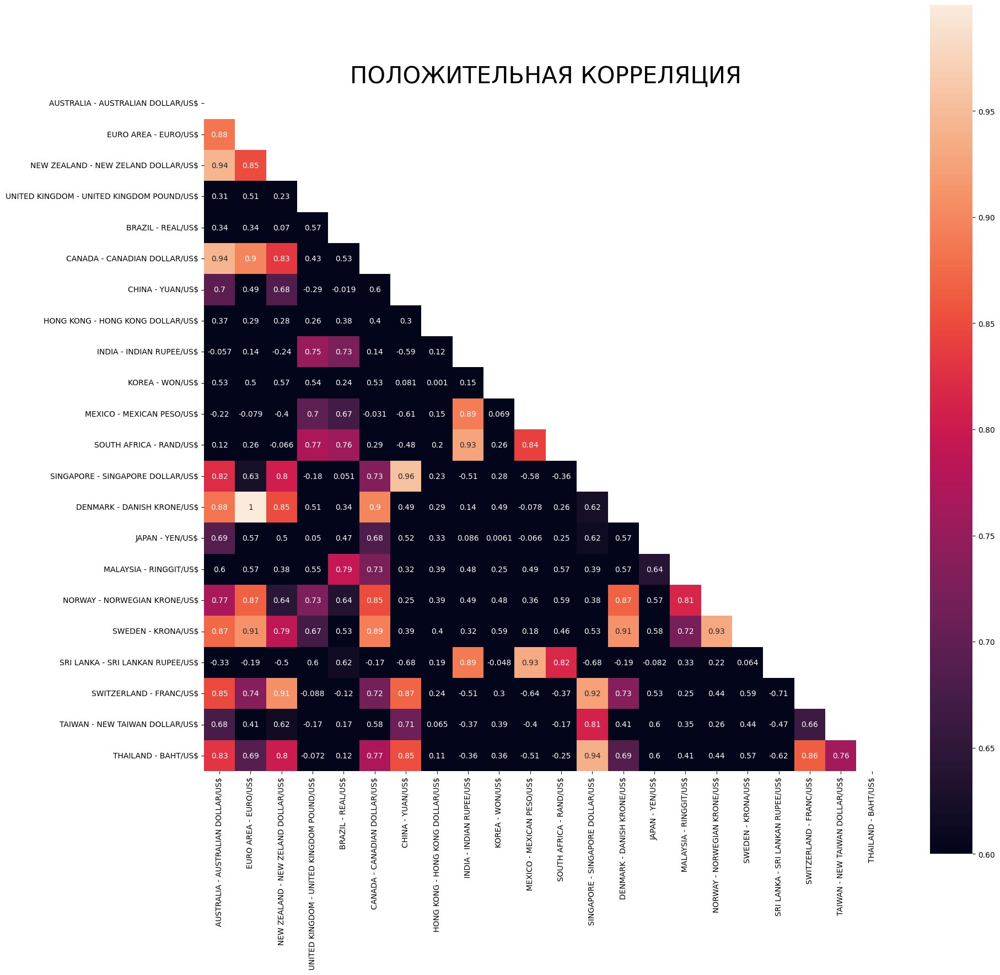

In [38]:
# ГРАФИК ПОЛОЖИТЕЛЬНОЙ КОРРЕЛЯЦИИ
fig, ax = plt.subplots(figsize=(20,20))
g = sns.heatmap(data=df_CORR, annot=True, ax=ax, square=True, vmin=0.6,
                # построение угла
                mask=np.triu(df_CORR)
                );
# заголовок
strtitle = "ПОЛОЖИТЕЛЬНАЯ КОРРЕЛЯЦИЯ"
g.set_title(label=strtitle, fontdict={'fontsize':30})

# сохранение графика
saveplot(fig=fig, strtitle=strtitle)

plt.show()

### **10.1.2. Отрицательная корреляция**

    На графике показаны пары валют с отрицательной корреляцией. Это означает, что при увеличении курса одной валютной пары снижается курс другой валютной пары. И наоборот при снижении курса одной валютной пары, происходит рост курса другой валютной пары.

Файл 'images/Отрицательная_Корреляция.png' сохранён


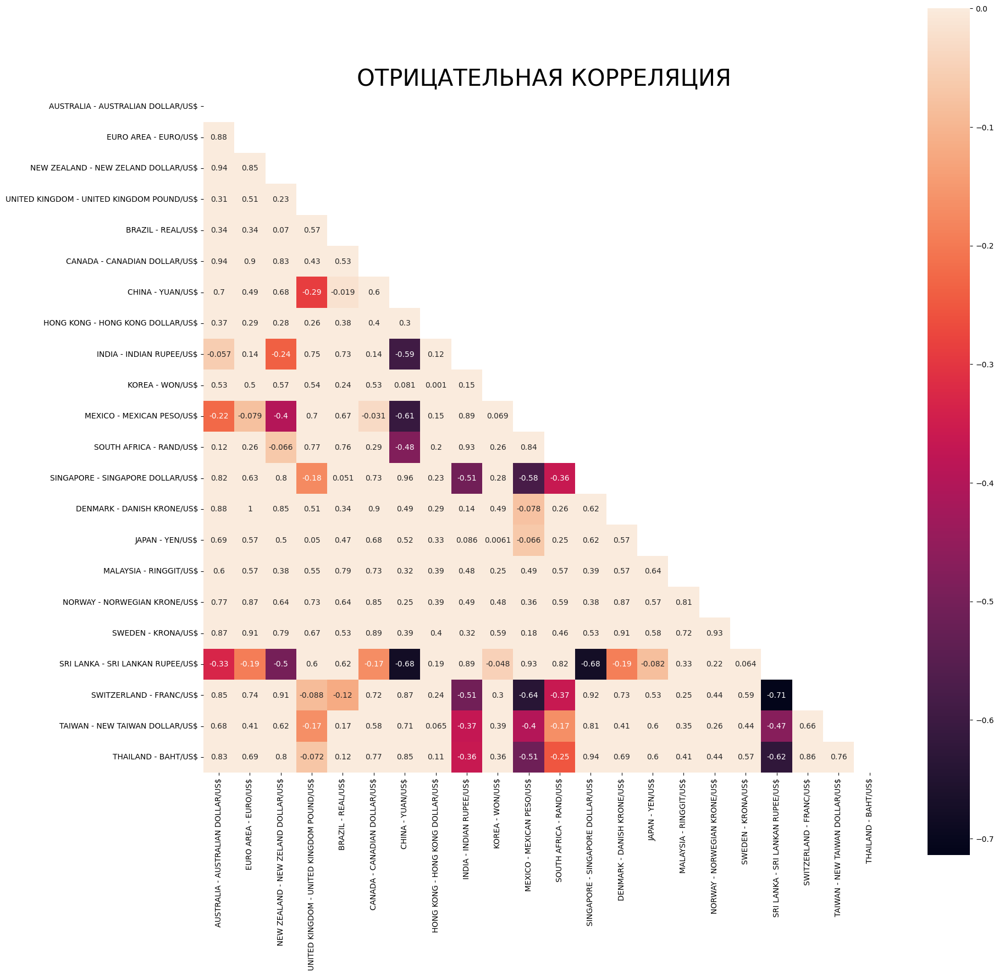

In [39]:
fig, ax = plt.subplots(figsize=(20,20))
g = sns.heatmap(data=df_CORR, annot=True, ax=ax, square=True, vmax=0,
                # построение угла
                mask=np.triu(df_CORR)
                )
# заголовок
strtitle = "ОТРИЦАТЕЛЬНАЯ КОРРЕЛЯЦИЯ"
g.set_title(label=strtitle, fontdict={'fontsize':30})

# сохранение графика
saveplot(fig=fig, strtitle=strtitle)
plt.show()

## **10.2. Тепловая карта агрегаторов**

    На графике подсвечены области для агрегаторов корреляции. Высокие значения 'std' > 50% указывают на большой разброс данных у выбранных параметров.

Файл 'images/Тепловая_Карта_Агрегаторов.png' сохранён


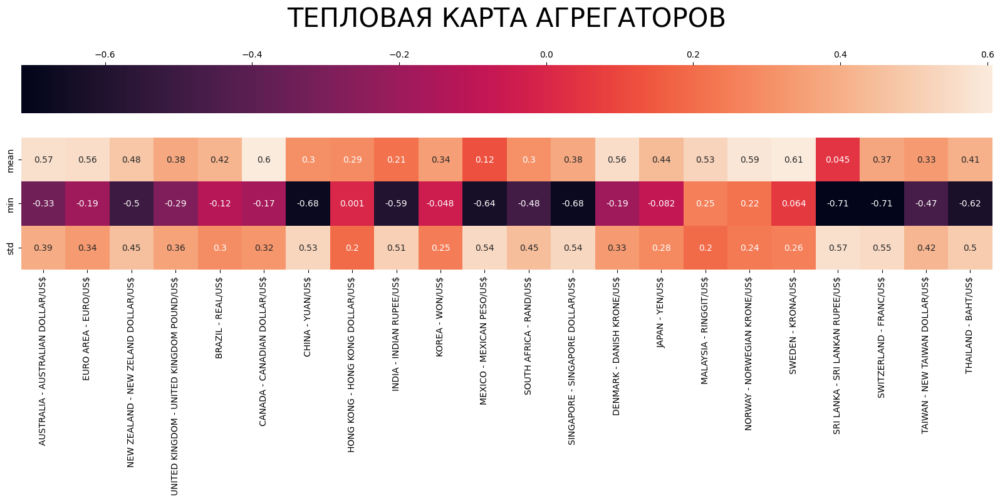

In [40]:
# ТЕПЛОВАЯ КАРТА АГРЕГАТОРОВ
fig, ax = plt.subplots(figsize=(20,10))
g = sns.heatmap(data=df_CORR_AGGREGTORS.T, annot=True, ax=ax, square=True,
                # параметры размещения тепловой шкалы
                cbar_kws={"orientation":"horizontal",
                          "location":"top"},
                )

# заголовок
strtitle = "ТЕПЛОВАЯ КАРТА АГРЕГАТОРОВ"
g.set_title(label=strtitle, fontdict={'fontsize':30}, y=1.8)

# сохранение графика
saveplot(fig=fig, strtitle=strtitle)
plt.show()

## **10.3. ГРАФИКИ ВАЛЮТНЫХ ПАР**

    На графиках показано распределение основных данных в пределах [min,max] для каждой курсовой пары.

In [41]:
# ФУНКЦИЯ ПОСТРОЕНИЯ ГРАФИКОВ КУРСОВ ДЛЯ ВАЛЮТНЫХ ПАР
def plot_box_grid(data, strtitle:str,figsize=(20,20)) -> None:
    """ФУНКЦИЯ ПОСТРОЕНИЯ ГРАФИКОВ КУРСОВ ДЛЯ ВАЛЮТНЫХ ПАР"""
    fig = plt.figure(figsize=figsize)
    # plt.rcParams['figure.figsize'] = figsize    # внешняя фигура
    col_list = data.columns.to_list()           # список колонок
    num_cell = ceil(len(col_list)**0.5)         # количество ячеек сетки , например "2x2"

    # заполнение фигур по заданной сетке
    # конечные ячейки без данных не отображаются
    for i in range(len(col_list)):
        ax = plt.subplot(num_cell, num_cell, i+1);
        # ax.boxplot(data[col_list[i]]);

        # sns.boxplot(data[col_list[i]], ax=ax);
        
        sns.violinplot(data[col_list[i]], ax=ax);

        ax.axes.xaxis.set_ticklabels([]);
        ax.set_xlabel(col_list[i], fontsize=8);

    # заголовок
    strtitle = strtitle
    plt.title(label=strtitle, fontdict={'fontsize':30}, y=num_cell+1);

    # сохранение графика
    saveplot(fig=fig, strtitle=strtitle)
    plt.show()



### **10.3.1. Графики курсов валютных пар**

Файл 'images/Графики_Курсов_Валютных_Пар.png' сохранён


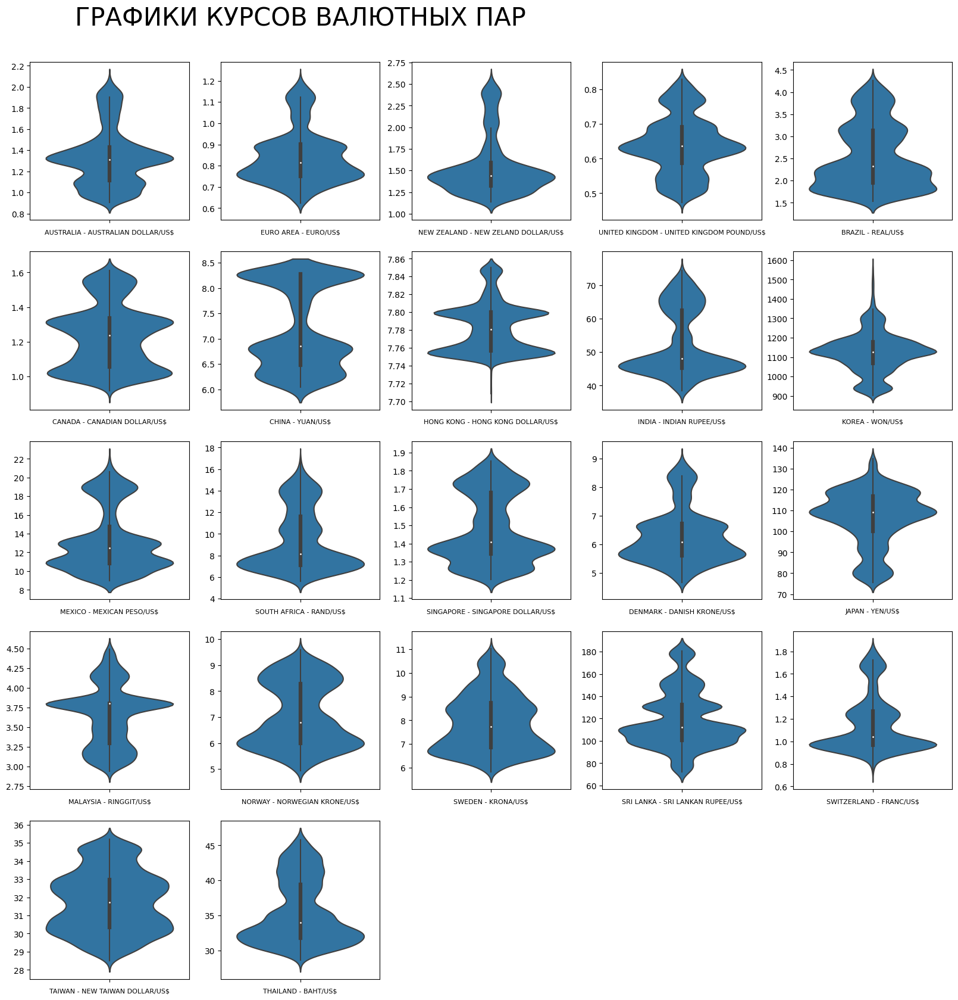

In [42]:
# Графики курсов валютных пар
plot_box_grid(data=df_DATE_short, strtitle="ГРАФИКИ КУРСОВ ВАЛЮТНЫХ ПАР")


### **10.3.2. Графики зависимостей курсов валютных пар**

Наиболее интересный график практически прямолинейной зависимости для курсовых пар '`DENMARK - DANISH KRONE/US$`' & '`EURO AREA - EURO/US$`' с максимальным коэффициентом корреляции из всех зависимостей, равный '`0.999917`'.

Так же есть несколько графиков, на которых распределение данных эквидистантно повторяет направление движения курса валюты и 

In [43]:
# ФУНКЦИЯ ПОСТРОЕНИЯ ПАРНЫХ ГРАФИКОВ
def draw_pairplot(df_data:DataFrame, strtitle:str, fontsize:float =20, subfolder:str="", isShow:bool=False) -> None:
    g = sns.pairplot(df_data, corner=True, kind='reg',
                     # цвет графиков
                     plot_kws = {'color': 'green', 'marker': 'o',       # основные
                                 # линия регрессии
                                 'line_kws':{'color':'red'},                                 
                                 # данные наполнения 'scatterplot'
                                 'scatter_kws': {'edgecolor': 'white',
                                                 'alpha': 0.1}},     
                     # диагональ
                     diag_kws = {'color': 'orange'},
                    );
    # заголовок
    g.fig.suptitle(strtitle, y=0, fontsize=100);

    # сохранение файла
    saveplot(fig=g, strtitle=strtitle, subfolder=subfolder)

    # режим отображения графиков на экране
    if isShow:
        plt.show()
    else:
        plt.close()
    

### **10.3.3. ПАРНЫЕ ГРАФИКИ ВАЛЮТНЫХ ПАР ЗА ВЕСЬ ПЕРИОД**

Закомментированный код графика отобразит график только для валютных пар

In [44]:
# # ПАРНЫЕ ГРАФИКИ ВАЛЮТНЫХ ПАР ЗА ВЕСЬ ПЕРИОД
# draw_pairplot(df_data=df_DATE_short, strtitle="ПАРНЫЕ ГРАФИКИ ВАЛЮТНЫХ ПАР ЗА ВЕСЬ ПЕРИОД без данных о датах")

Файл 'images/Парные_Графики_Валютных_Пар_За_Весь_Период.png' сохранён


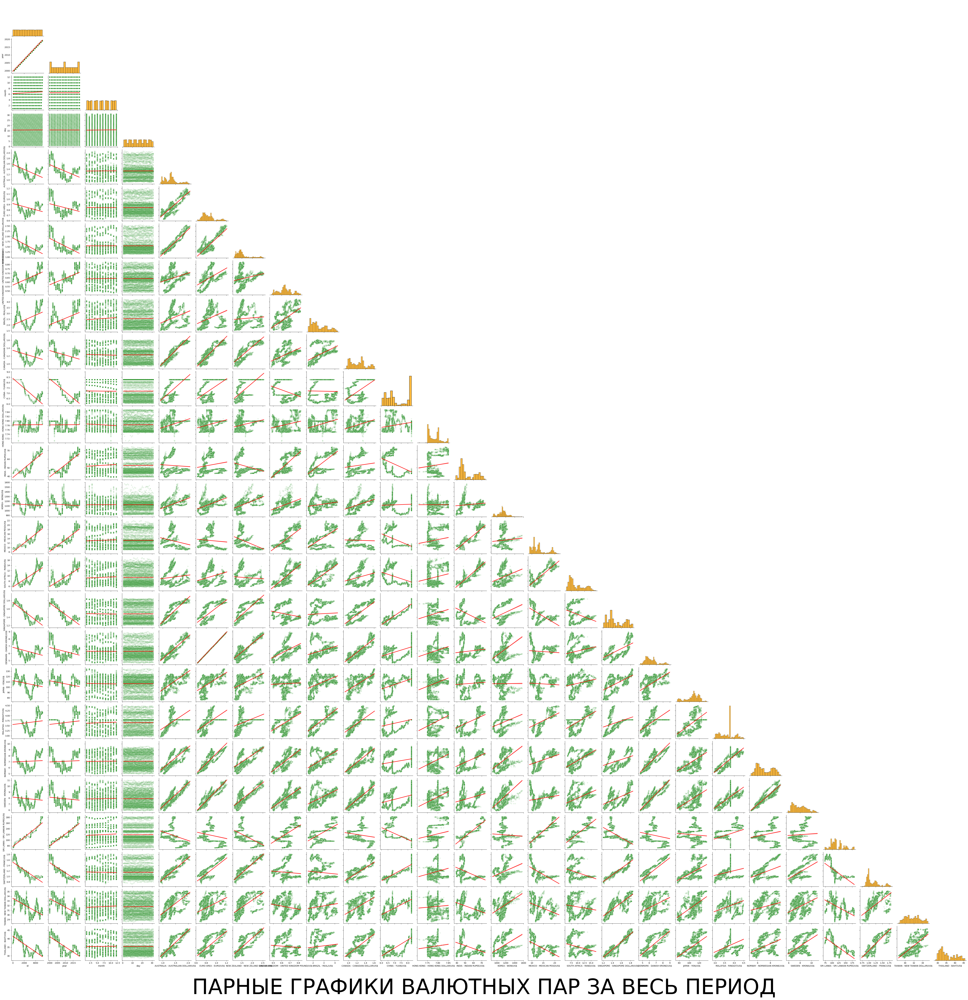

In [45]:
# ПАРНЫЕ ГРАФИКИ ВАЛЮТНЫХ ПАР ЗА ВЕСЬ ПЕРИОД
draw_pairplot(df_data=df_DATE, strtitle="ПАРНЫЕ ГРАФИКИ ВАЛЮТНЫХ ПАР ЗА ВЕСЬ ПЕРИОД", isShow=True)

In [46]:
# списки периодов времени
year_list = df_DATE.year.unique().tolist()       # год
month_list = df_DATE.month.unique().tolist()     # месяц
day_list = df_DATE.weekday.unique().tolist()     # день

### **10.3.4. ГРАФИКИ ВАЛЮТНЫХ ПАР ЗА ОПРЕДЕЛЁННЫЙ ПЕРИОД**

По причине обработки большого объёма данных все результаты построения графиков не будут выводиться на экран. С результатами можно ознакомиться в каталоге ```./images``` с разделением по подкаталогам, для соответствующих вычислений за определённый период. Всем файлам автоматически присваивается наименование периода обработки.

**<span style="color: red;">ПРИМЕЧАНИЕ</span>**

<div style="background-color: #FAF0C6;">Для данного блока построения графиков для каждого шага потребуется продолжительное время.


Для построения парных графиков затрачено:

1. помесячных <span style="color: red;">~80 минуты</span>;
2. годовых <span style="color: red;">~173 минут</span>;
3. по дням недели <span style="color: red;">~37 минут</span>.</div>

In [47]:
# ПАРНЫЕ ГРАФИКИ ВАЛЮТНЫХ ПАР ЗА ПЕРИОД
def draw_pairplot_period(df_data:DataFrame, period:str, datelist:list,strtitle:str) -> None:

    # список месяцев
    if period == "month":
        dates_dict = {1: 'Январь',
                      2: 'Февраль',
                      3: 'Март',
                      4: 'Апрель',
                      5: 'Май',
                      6: 'Июнь',
                      7: 'Июль',
                      8: 'Август',
                      9: 'Сентябрь',
                      10: 'Октябрь',
                      11: 'Ноябрь',
                      12: 'Декабрь'
                    }
        
    # список дней недели
    elif period == "weekday":
        dates_dict = {"Monday": "Понедельник",
                      "Tuesday": "Вторник",
                      "Wednesday": "Среда",
                      "Thursday": "Четверг",
                      "Friday": "Пятница",
                      "Saturday": "Суббота",
                      "Sunday": "Воскресенье"
                    }



    # построение графиков с сохранением на диск
    for val in datelist:
        # составная часть заголовка
        val = int(val) if period.isdigit() else val
        caption:str = val if period == "year" else dates_dict[val]

        # print(val)

        # построение графика
        draw_pairplot(df_data=df_DATE[df_DATE[period] == val],  # данные                      
                      strtitle=str(caption).upper() + strtitle,      # заголовок                      
                      subfolder=period,                         # подкаталог                      
                      isShow=False                              # вывод графика на экран
                      )

### **10.3.5. Графики курсов валютных пар по месяцам**

In [48]:
# ПАРНЫЕ ГРАФИКИ ВАЛЮТНЫХ ПАР ЗА МЕСЯЦ
draw_pairplot_period(df_data=df_DATE, period="month", datelist=month_list, strtitle="-ГРАФИКИ ВАЛЮТНЫХ ПАР ЗА МЕСЯЦ")

Файл 'images\month/Январь-Графики_Валютных_Пар_За_Месяц.png' сохранён
Файл 'images\month/Февраль-Графики_Валютных_Пар_За_Месяц.png' сохранён
Файл 'images\month/Март-Графики_Валютных_Пар_За_Месяц.png' сохранён
Файл 'images\month/Апрель-Графики_Валютных_Пар_За_Месяц.png' сохранён
Файл 'images\month/Май-Графики_Валютных_Пар_За_Месяц.png' сохранён
Файл 'images\month/Июнь-Графики_Валютных_Пар_За_Месяц.png' сохранён
Файл 'images\month/Июль-Графики_Валютных_Пар_За_Месяц.png' сохранён
Файл 'images\month/Август-Графики_Валютных_Пар_За_Месяц.png' сохранён
Файл 'images\month/Сентябрь-Графики_Валютных_Пар_За_Месяц.png' сохранён
Файл 'images\month/Октябрь-Графики_Валютных_Пар_За_Месяц.png' сохранён
Файл 'images\month/Ноябрь-Графики_Валютных_Пар_За_Месяц.png' сохранён
Файл 'images\month/Декабрь-Графики_Валютных_Пар_За_Месяц.png' сохранён


### **10.3.6. Графики курсов валютных пар по годам**

In [49]:
# ПАРНЫЕ ГРАФИКИ ВАЛЮТНЫХ ПАР ЗА ГОД
draw_pairplot_period(df_data=df_DATE, period="year", datelist=year_list, strtitle="-ГРАФИКИ ВАЛЮТНЫХ ПАР ЗА ГОД")

Файл 'images\year/2000-Графики_Валютных_Пар_За_Год.png' сохранён
Файл 'images\year/2001-Графики_Валютных_Пар_За_Год.png' сохранён
Файл 'images\year/2002-Графики_Валютных_Пар_За_Год.png' сохранён
Файл 'images\year/2003-Графики_Валютных_Пар_За_Год.png' сохранён
Файл 'images\year/2004-Графики_Валютных_Пар_За_Год.png' сохранён
Файл 'images\year/2005-Графики_Валютных_Пар_За_Год.png' сохранён
Файл 'images\year/2006-Графики_Валютных_Пар_За_Год.png' сохранён
Файл 'images\year/2007-Графики_Валютных_Пар_За_Год.png' сохранён
Файл 'images\year/2008-Графики_Валютных_Пар_За_Год.png' сохранён
Файл 'images\year/2009-Графики_Валютных_Пар_За_Год.png' сохранён
Файл 'images\year/2010-Графики_Валютных_Пар_За_Год.png' сохранён
Файл 'images\year/2011-Графики_Валютных_Пар_За_Год.png' сохранён
Файл 'images\year/2012-Графики_Валютных_Пар_За_Год.png' сохранён
Файл 'images\year/2013-Графики_Валютных_Пар_За_Год.png' сохранён
Файл 'images\year/2014-Графики_Валютных_Пар_За_Год.png' сохранён
Файл 'images\year/2015-Гр

### **10.3.7. Графики курсов валютных пар по дням недели за весь период**

In [50]:
# ПАРНЫЕ ГРАФИКИ ВАЛЮТНЫХ ПАР ПО ДНЯМ НЕДЕЛИ ЗА ВЕСЬ ПЕРИОД
draw_pairplot_period(df_data=df_DATE, period="weekday", datelist=day_list, strtitle="-ГРАФИКИ ВАЛЮТНЫХ ПАР ПО ДНЯМ НЕДЕЛИ ЗА ВЕСЬ ПЕРИОД")

Файл 'images\weekday/Понедельник-Графики_Валютных_Пар_По_Дням_Недели_За_Весь_Период.png' сохранён
Файл 'images\weekday/Вторник-Графики_Валютных_Пар_По_Дням_Недели_За_Весь_Период.png' сохранён
Файл 'images\weekday/Среда-Графики_Валютных_Пар_По_Дням_Недели_За_Весь_Период.png' сохранён
Файл 'images\weekday/Четверг-Графики_Валютных_Пар_По_Дням_Недели_За_Весь_Период.png' сохранён
Файл 'images\weekday/Пятница-Графики_Валютных_Пар_По_Дням_Недели_За_Весь_Период.png' сохранён


## **10.4. ГРАФИКИ С ОТСУТСТВУЮЩИМИ ЗНАЧЕНИЯМИ**

### **10.4.1. СТАТИСТИКА ПО ДАТАМ С ОТСУТСТВУЮЩИМИ ДАННЫМИ ЗА ВЕСЬ ПЕРИОД**

In [51]:
# ФУНКЦИЯ ПОДГОТОВКИ ДАННЫХ ДЛЯ PIE ГРАФИКОВ
def groupby_tupple(df_data:DataFrame, group:list, column:str) -> tuple:
    count_list = df_data.groupby(group)[column].count()    # количество
    names_list:list  = count_list.index.to_list()          # названия
    return (count_list, names_list)


Файл 'images\nodata/Статистика_По_Датам_С_Отсутствующими_Данными_За_Весь_Период.png' сохранён


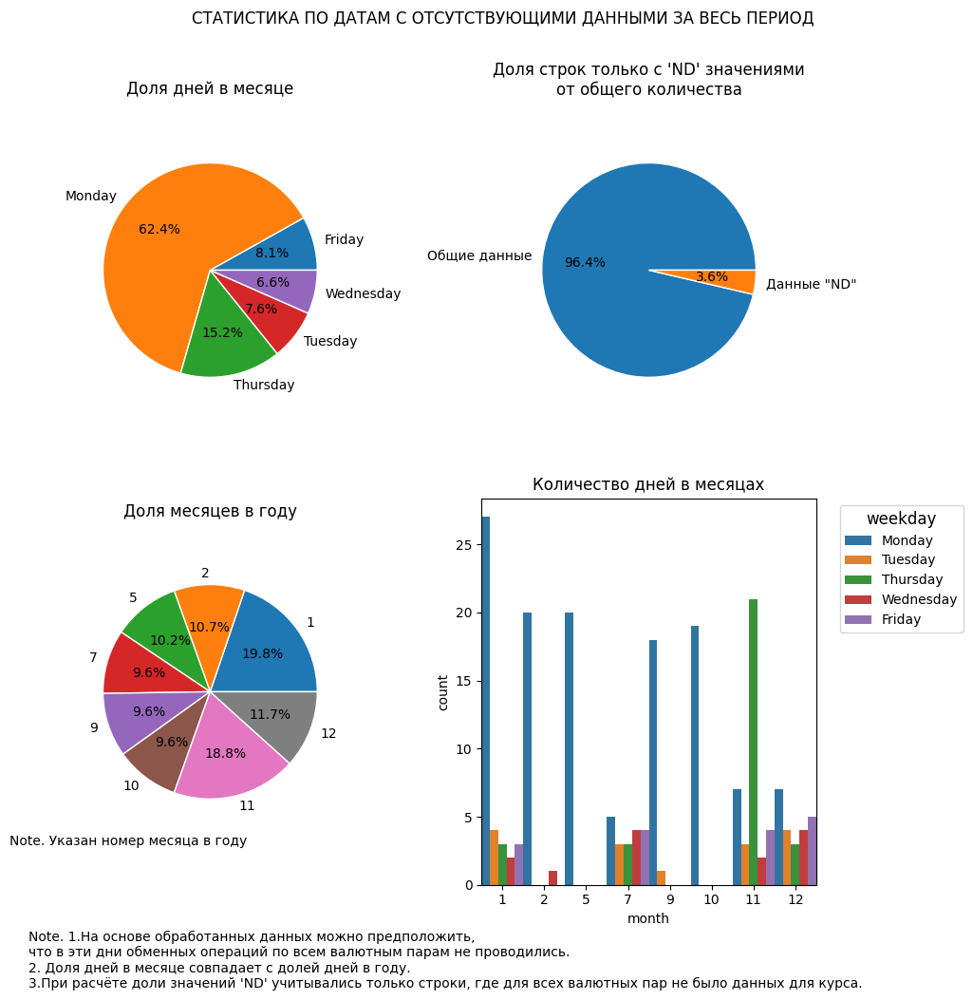

In [52]:
# ПОСТРОЕНИЕ ГРАФИКОВ => СТАТИСТИКА ПО ДАТАМ С ОТСУТСТВУЮЩИМИ ДАННЫМИ ЗА ВЕСЬ ПЕРИОД
# подготовка данных для распределения по осям
x1, y1 = groupby_tupple(df_NAN, group=['weekday'], column="month")
x2, y2 = groupby_tupple(df_NAN, group=['weekday'], column="year")
x3, y3 = groupby_tupple(df_NAN, group=['month'], column="year")

# создание фигур
fig, axs = plt.subplots(nrows=2, ncols=2, figsize =(10,10))
strtitle = "СТАТИСТИКА ПО ДАТАМ С ОТСУТСТВУЮЩИМИ ДАННЫМИ ЗА ВЕСЬ ПЕРИОД"
fig.suptitle(strtitle)
# примечание под общей фигурой
fig.text(x=0, y=-0.05, s="Note. 1.На основе обработанных данных можно предположить,\nчто в эти дни обменных операций по всем валютным парам не проводились.\n2. Доля дней в месяце совпадает с долей дней в году.\n3.При расчёте доли значений 'ND' учитывались только строки, где для всех валютных пар не было данных для курса.")

# 1.Верхний левый
axs[0,0].set_title("Доля дней в месяце")
axs[0,0].pie(x=x1, labels=y1, wedgeprops={"linewidth": 1, "edgecolor": "white"}, autopct='%1.1f%%', radius=0.8);

# 2. Верхний правый
axs[0,1].set_title("Доля строк только с 'ND' значениями\nот общего количества")
axs[0,1].pie(x=[df_DATE.index.size,df_NAN.index.size],
                labels=['Общие данные', 'Данные "ND"'],
                wedgeprops={"linewidth": 1, "edgecolor": "white"}, autopct='%1.1f%%', radius=0.8);


# 3. Нижний левый
axs[1,0].set_title("Доля месяцев в году")
axs[1,0].pie(x=x3, labels=y3, wedgeprops={"linewidth": 1, "edgecolor": "white"}, autopct='%1.1f%%', radius=0.8);
# примесание под фигурой п.3
fig.text(x=-0.02, y=0.1, s="Note. Указан номер месяца в году")

# 4.Нижний правый
axs[1,1].set_title("Количество дней в месяцах")
g4 = sns.countplot(data=df_NAN, x='month', hue='weekday', width=1, ax=axs[1,1]);
# смещение легенды
sns.move_legend(g4, "upper left", bbox_to_anchor=(1.05, 1), ncol=1, title_fontsize=12)

# засстояние между графиками
fig.tight_layout(w_pad=2)

# сохранение графика
saveplot(fig=fig, strtitle=strtitle, subfolder='nodata')
plt.show()

### **10.4.2. ДИНАМИКА ДНЕЙ В ГОДУ БЕЗ ОБМЕННЫХ ОПЕРАЦИЙ**

Анализ графиков динамики дней для строк с полным отсутствием данных для валютных пар по обменным курсам валют выделяют `Понедельник` как наиболее встречающийся на протяжении всего исследуемого периода.

Основные дни отсутствия данных выпадают на начало, либо конец месяца не зависимо от месяца. При этом наибольшее отсутствие данных приходится на ```1 января, 4 июля, 11 ноября и 25 декабря``` не зависимо от года. Можно сделать предположение, что отсутствие данных связано с закрытием торгов по случаю национальных праздников.

Файл 'images\nodata/Динамика_По_Датам_С_Отсутствующими_Данными_За_Весь_Период.png' сохранён


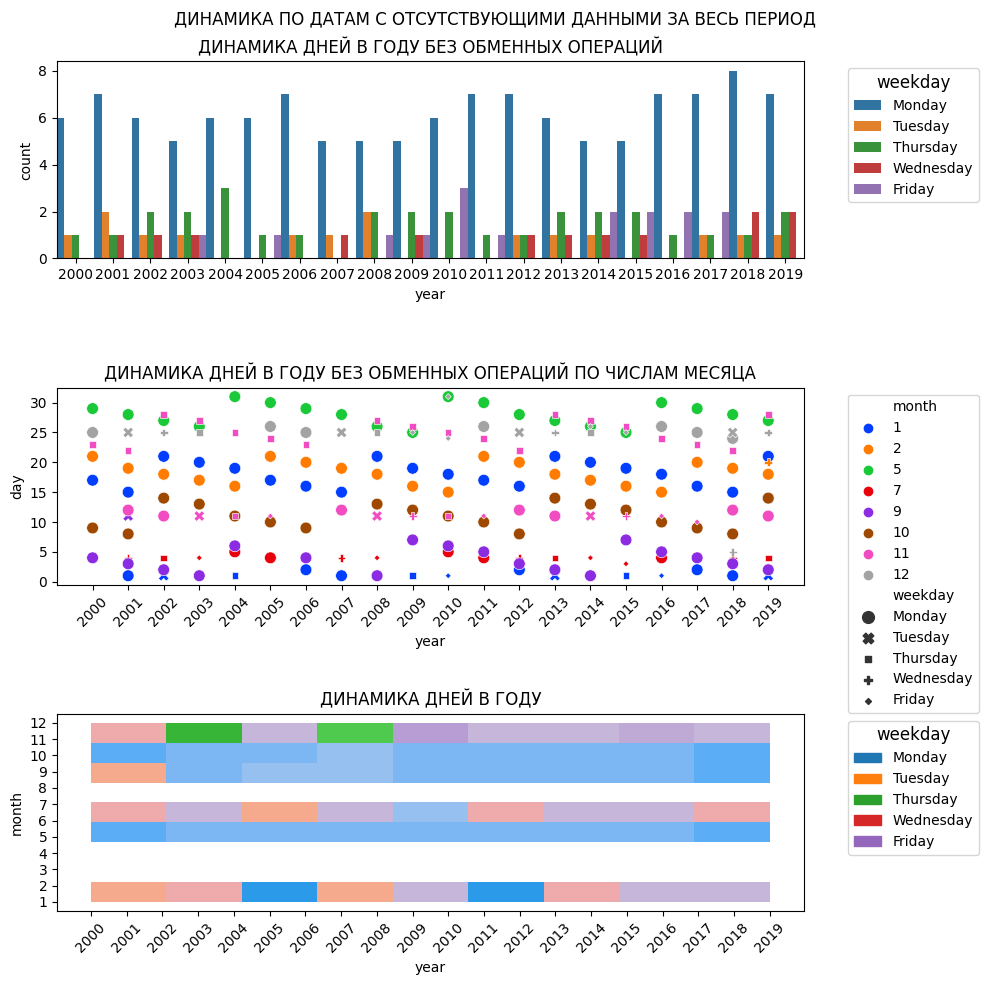

In [53]:
# создание фигур
fig, axs = plt.subplots(nrows=3, ncols=1, figsize =(10,10))
strtitle_0 = "ДИНАМИКА ПО ДАТАМ С ОТСУТСТВУЮЩИМИ ДАННЫМИ ЗА ВЕСЬ ПЕРИОД"
fig.suptitle(strtitle_0)
# примечание под общей фигурой
# fig.text(x=0, y=0, s="Note. 1.На основе обработанных данных можно предположить,\nчто в эти дни обменных операций по всем валютным парам не проводились.\n2. Доля дней в месяце совпадает с долей дней в году.")

# 1. Верхний
g = sns.countplot(data=df_NAN, x='year', hue='weekday', width=1, ax=axs[0]);
strtitle = "ДИНАМИКА ДНЕЙ В ГОДУ БЕЗ ОБМЕННЫХ ОПЕРАЦИЙ"
g.set_title(strtitle);
sns.move_legend(g, "upper left", bbox_to_anchor=(1.05, 1), ncol=1, title_fontsize=12)

# размеры фигуры 1
# axs[0].set_aspect(0.5)

# размерность оси 'X'
# ******************************
# по какой-то причине этот код стирает сам график, оставляя белое поле
# g.set_xlim(min(year_list)-1, max(year_list)+1)
# g.set_xticks(range(min(year_list),max(year_list)+1,1), labels=year_list,  rotation=45)
# ******************************

# 2. Нижний
g2 = sns.scatterplot(data=df_NAN, x='year', hue='month', y='day',
                    #  размерности на графике
                     size='weekday', style='weekday', palette='bright', ax=axs[1]);

strtitle = "ДИНАМИКА ДНЕЙ В ГОДУ БЕЗ ОБМЕННЫХ ОПЕРАЦИЙ ПО ЧИСЛАМ МЕСЯЦА"
g2.set_title(strtitle);
# g2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
sns.move_legend(g2, "upper left", bbox_to_anchor=(1.05, 1), ncol=1, title_fontsize=12)

# размерность оси 'X'
g2.set_xlim(min(year_list)-1, max(year_list)+1)
g2.set_xticks(range(min(year_list),max(year_list)+1,1), labels=year_list,  rotation=45)


# 3. Нижний
strtitle = "ДИНАМИКА ДНЕЙ В ГОДУ"
g3 = sns.histplot(data=df_NAN, x='year', y='month', hue='weekday', kde=True, ax=axs[2], legend=True);
g3.set_title(strtitle);
# смещение легенды
sns.move_legend(g3, "upper left", bbox_to_anchor=(1.05, 1), ncol=1, title_fontsize=12)

# размерность оси 'Y'
g3.set_yticks(range(min(month_list),max(month_list)+1,1), labels=month_list,  rotation=0)
g3.set_xticks(range(min(year_list),max(year_list)+1,1), labels=year_list,  rotation=45)

# засстояние между графиками
fig.tight_layout(h_pad=0.5)

# сохранение графика
saveplot(fig=fig, strtitle=strtitle_0, subfolder='nodata')
plt.show()


### **10.4.5. ДИНАМИКА ДНЕЙ НЕДЕЛИ БЕЗ ДАННЫХ ПО КУРСАМ ДЛЯ ВСЕХ ВАЛЮТ**

#### **10.4.5.1. ПОЛНЫЙ ГРАФИК**

Файл 'images\nodata/Полный_График_Динамики_Дней_Недели_Без_Данных_По_Курсам_Для_Всех_Валют.png' сохранён


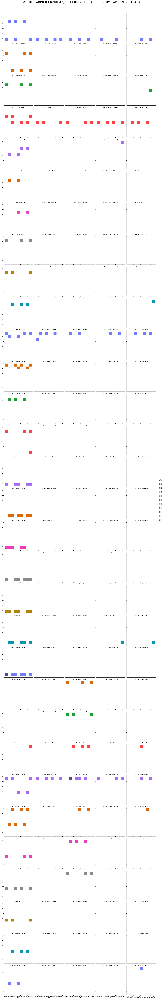

In [54]:
# полный график динамики дней
g = sns.displot(data=df_NAN, x='year', y='month', hue='day', col='weekday', #col_wrap=3,
                color='weekday', palette='bright', row='day');
strtitle = "ПОЛНЫЙ ГРАФИК ДИНАМИКИ ДНЕЙ НЕДЕЛИ БЕЗ ДАННЫХ ПО КУРСАМ ДЛЯ ВСЕХ ВАЛЮТ"
plt.suptitle(strtitle, y=1.01, fontsize=30);
# ПРИМЕЧАНИЕ. Почему-то этот код применяется только для одной из шкал
# если оставить без изменения, то для шкалы лет появляются значения => '2017.5'
plt.xticks(year_list, labels=year_list, rotation=45);

# сохранение графика
saveplot(fig=g, strtitle=strtitle, subfolder='nodata')
plt.show()

#### **10.4.5.2. СВОДНЫЙ ГРАФИК ДИНАМИКИ ДНЕЙ НЕДЕЛИ БЕЗ ДАННЫХ ПО КУРСАМ ВАЛЮТ**

Файл 'images\nodata/Сводный_График_Динамики_Дней_Без_Данных.png' сохранён


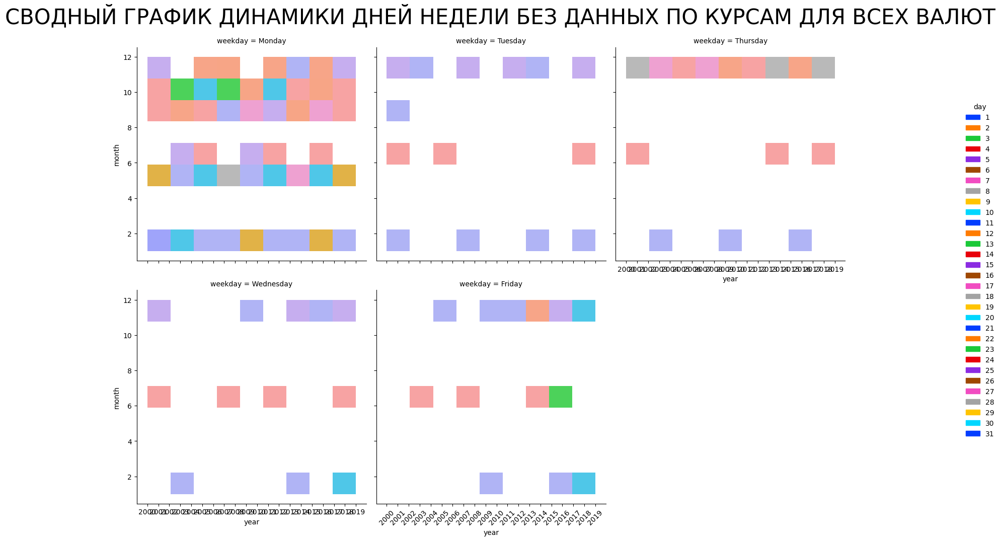

In [55]:
# СВОДНЫЙ график динамики дней
g = sns.displot(data=df_NAN, x='year', y='month', hue='day', col='weekday', col_wrap=3,
                color='weekday', palette='bright');
strtitle = "СВОДНЫЙ ГРАФИК ДИНАМИКИ ДНЕЙ НЕДЕЛИ БЕЗ ДАННЫХ ПО КУРСАМ ДЛЯ ВСЕХ ВАЛЮТ"
plt.suptitle(strtitle, y=1.05, fontsize=30);
# ПРИМЕЧАНИЕ. Почему-то этот код применяется только для одной из шкал
# если оставить без изменения, то для шкалы лет появляются значения => '2017.5'
plt.xticks(year_list, labels=year_list, rotation=45);

# сохранение графика
saveplot(fig=g, strtitle="СВОДНЫЙ ГРАФИК ДИНАМИКИ ДНЕЙ БЕЗ ДАННЫХ", subfolder='nodata')
plt.show()

# **11. РЕЗЮМЕ**

В данной работе сделана первичная визуальная оценка таблиц и графиков. Выводы и заключения оформлены в каждом разделе, по мере очистки и анализа данных.

Детально ознакомиться с графиками в хорошем качестве и сводными таблицами по курсам валют для валютных пар можно в каталогах:

1. `"./data"`
2. `"./images"`
